# 1 Dataset Configuration

Before we get started, we need to configure the provided data files in order to make them compatible with the format expected by our neural net

Let's start by creating a separate validation set by moving 20% of the images in each category from the training set

In [ ]:
import os
import random

path = './data/train/'
path_new = './data/valid/'
directories = os.listdir(path)

for directory in directories:
    for i in range(55):
        filenames = os.listdir(path+directory)
        rand_file_idx = random.randint(0, len(filenames) - 1)
        os.rename(path+directory+'/'+filenames[rand_file_idx], path_new+directory+'/'+filenames[rand_file_idx])

# 2 Setup

*In this module, we will use a CNN to help detect whether camera footage evidence has been forged. Forgery often involves splicing together footage from different cameras with metadata adjustments made. Hence, the only way to detect splicing is by identifying if the source devices themselves were different. We will train a CNN to recognize which devices images emanated from and use this information to detecy forgery.*

In [1]:
# fastai library imports
from fastai.imports import *
from fastai.transforms import *
from fastai.conv_learner import *
from fastai.model import *
from fastai.dataset import *
from fastai.sgdr import *
from fastai.plots import *
from fastai.dataset import *

In [2]:
# env config
PATH = "./data/"
sz = 256
arch = resnet34
batch_size = 10

# 3 Initial Exploration

In this section, we will explore the dataset to gain a better understanding of what we're working with

In [3]:
# transform/augment data and read it
def get_data(sz, batch_size):
    tfms = tfms_from_model(arch, sz, aug_tfms=transforms_side_on, max_zoom=1.1)
    data = ImageClassifierData.from_paths(PATH, tfms=tfms)
    return data

In [4]:
# get data in desired format
data = get_data(sz, batch_size)

Let's view some images in the training set at random

In [5]:
fn = PATH+data.trn_ds.fnames[0]; fn

'./data/train/HTC-1-M7/(HTC-1-M7)92.jpg'

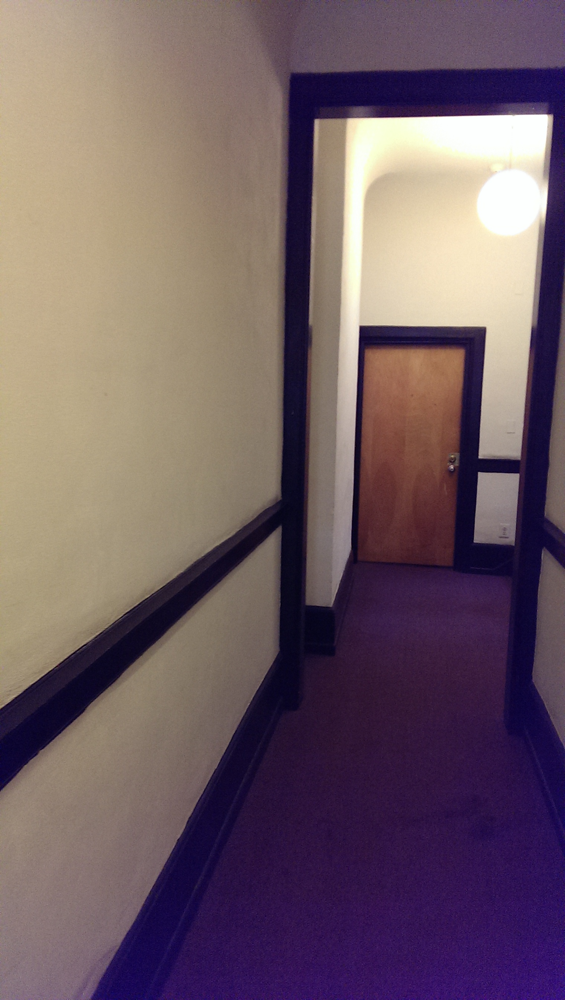

In [6]:
img = PIL.Image.open(fn); img

In [7]:
img.size

(1520, 2688)

In [8]:
fn2 = PATH+data.trn_ds.fnames[5]; fn2

'./data/train/HTC-1-M7/(HTC-1-M7)117.jpg'

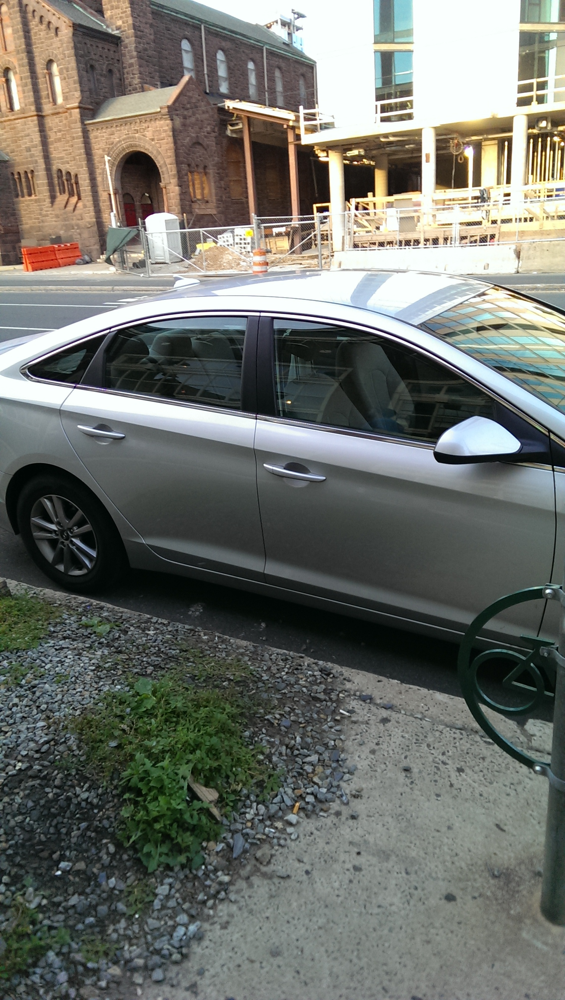

In [9]:
img2 = PIL.Image.open(fn2); img2

In [10]:
img2.size

(1520, 2688)

We note that the images are much larger than the 224x224 ImageNet images that were used to train the resnet34's weights. We will have to account for this fact in our CNN design.

# 3 Initial Model

## 3.1 Size = 256x256

### 3.1.1 Precompute 

In this section, we will retain all the precomputed activations of the resnet34 architecture to obtain a base model.

In [11]:
# run precomputed (weights) resnet34 model on our current dataset
learn = ConvLearner.pretrained(arch, data, precompute=True)

In [12]:
# use cyclic learning rate finder to generate lr plot
lrf = learn.lr_find()

  3%|▎         | 1/35 [00:00<00:26,  1.27it/s, loss=12.1]


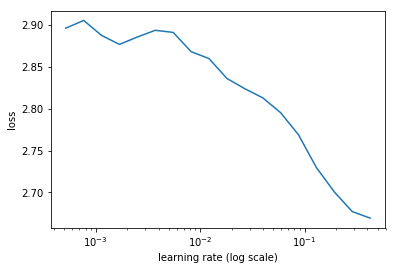

In [13]:
# plot the lr discovered to visualize and find optimal learning rate
learn.sched.plot()

In [14]:
lr = 0.1

In [15]:
learn.fit(lr, 3, cycle_len=1, cycle_mult=2)

epoch      trn_loss   val_loss   accuracy                
    0      2.40961    1.723701   0.412727  
    1      2.201024   1.68727    0.450909                 
    2      1.758138   1.606546   0.443636                 
    3      1.637263   1.599252   0.48                     
    4      1.440519   1.473255   0.516364                 
    5      1.195076   1.36069    0.549091                 
    6      1.027854   1.372642   0.54                     



[array([1.37264]), 0.5400000002167442]

### 3.1.2 Disable Precompute 

We can now disable precompute to allow the last two layers' weights to be adjusted for the current dataset

In [16]:
learn.precompute = False

In [17]:
learn.fit(lr, 3, cycle_len=1, cycle_mult=2)

epoch      trn_loss   val_loss   accuracy                 
    0      1.32857    1.402906   0.498182  
    1      1.33987    1.388789   0.523636                 
    2      1.244439   1.360885   0.552727                 
    3      1.260972   1.394526   0.543636                 
    4      1.218391   1.360345   0.549091                 
    5      1.139169   1.327036   0.549091                 
    6      1.059101   1.32908    0.561818                 



[array([1.32908]), 0.5618181827935306]

### 3.1.3 Differential Learning Rate Annealing

Now that we have a good final layer trained, we can try fine-tuning the other layers.

In [18]:
# unfreeze all layers
learn.unfreeze()

We will apply differential rate annealing to train the earlier layers with lower learning rates. We do this because earlier layers have more general purpose functions that are not as specific to the current dataset and hence, require lesser fine tuning.

In [19]:
lr=np.array([0.1/4,0.1/2,0.1])

Next, we will play around with the epochs to try and maximize the effects of the stochastic gradient descent with random restarts. To do so, we will set cycle_mult=2 so that the number of epochs is doubled in each cycle. Doing this also helps avoid underfitting by allowing more time to find global minima.

In [20]:
# refit with cycle_mult=2# refit  
learn.fit(lr, 3, cycle_len=1, cycle_mult=2)

epoch      trn_loss   val_loss   accuracy                 
    0      2.085521   1.962307   0.394545  
    1      1.792597   1.87315    0.396364                 
    2      1.442315   1.051979   0.665455                 
    3      1.392705   2.502486   0.341818                 
    4      1.23726    1.086521   0.647273                 
    5      0.98737    0.793145   0.729091                  
    6      0.758225   0.627833   0.794545                  



[array([0.62783]), 0.7945454556291753]

## 3.2 Size = 512x512

In [21]:
sz = 512
lr = 0.1

In [22]:
learn.set_data(get_data(sz, batch_size))
learn.freeze() # freeze all but last layers for training
learn.fit(lr, 3, cycle_len=1, cycle_mult=2)

epoch      trn_loss   val_loss   accuracy                  
    0      0.59316    0.634107   0.794545  
    1      0.579175   0.653641   0.794545                  
    2      0.552028   0.628326   0.794545                  
    3      0.542249   0.64644    0.790909                  
    4      0.532875   0.635794   0.807273                  
    5      0.502322   0.611443   0.803636                  
    6      0.464592   0.605333   0.805455                  



[array([0.60533]), 0.8054545437205921]

In [ ]:
learn.unfreeze()
lr = [0.1/4, 0.1/2, 0.1]
learn.fit(lr, 3, cycle_len=1, cycle_mult=2)
learn.save(f'{sz}')